## Housing Sale Price Predictions

### Term Project

## Lincoln Brown

## DSC550-T302

## Professor Werner


## Analysis Discussion

This project will be focused on answering the question of what houses in Kimball, NE will sell for. The goal of my project is to predict house sale prices. The target for this model will be the sale price and I will use a dataset that has 722 records of real estate sales that occurred in the last five years to accomplish this. The dataset records will include houses that sold for more than \\$1000.00 dollars. This stipulation is necessary because houses often transfer parties to trusts or relatives for a sale price of \\$0.00. Since this would create a lot of outliers, I have chosen to eliminate these data points. 
<br>
This is an important question for me as a homeowner in Kimball but will also be useful for understanding the relationship between the assessed values for houses in Kimball and the price they are selling for. Taxes are an impactful aspect of homeownership, and there has been much discussion in Nebraska about our property taxes. Understanding which houses sell for more and what their sell values versus assessed values will be beneficial in understanding why some property's real estate taxes increase while others do not.  
<br>
I will be examining multiple features of properties in Kimball, NE to better understand this relationship, including building size, garage size, number of bathrooms, number of bedrooms, year built, condition of the house, and total square footage of the house. 

The dataset I will be using was gathered from kimball.gworks.com, this is a publicly accessible website used by assessors to share property information with the public. There is a notice on the website that the data is not to be used in preparation of legal documents, so it is possible that the data is inaccurate. 

## Import Libaries

In [1]:
from bs4 import BeautifulSoup as bs
import json
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import numpy as np
import os
import pandas as pd
from random import randrange
import re
import requests
import seaborn as sns
from time import sleep
from ydata_profiling import ProfileReport

## PID Requests

In [4]:
# Define load_json function to process files
def load_json(results_file):
    pids = []
    with open(results_file, 'r') as data_file:
        data = data_file.readlines()
    for line in data:
        data_test = json.loads(line)
    for result in data_test['results']:
        pid = result.get('attributes', {}).get('PID')
        pids.append(pid)
    return pids

In [5]:
# URLs
#bulk_pid_url = "https://gis2.gworks.com/arcgis/rest/services/Kimball_County_NE_Assessor/MapServer/find"
#bulk_pid_query = "f=json&searchText=53000&layers=1,2&searchFields=&returnGeometry=true&sr=3857&token="
#detail_url = "https://report.gworks.com/report.ashx?county=kimball&id=530025930&type=assessor&subs=true&format=json"
#bulk_url = f"{bulk_pid_url}?{bulk_pid_query}"

In [6]:
# Create bulk pid searches based on pid formatting
bulk_pid_searches = []
bulk_pid_prefix = "5300"
for i in range(0,8):
    bulk_pid_searches.append(f"{bulk_pid_prefix}{i}")

# Add to catch any missed PIDs
bulk_pid_searches.append("530")
bulk_pid_searches.append("kimball")
bulk_pid_searches

['53000',
 '53001',
 '53002',
 '53003',
 '53004',
 '53005',
 '53006',
 '53007',
 '530',
 'kimball']

In [7]:
# Only need to run once to get query results
# We are bulk searching for parcel ids (pids)
# This will return a list of pids that we can then process individually
"""for pid in bulk_pid_searches:
    bulk_pid_url = "https://gis2.gworks.com/arcgis/rest/services/Kimball_County_NE_Assessor/MapServer/find"
    bulk_pid_query = f"f=json&searchText={pid}&layers=1,2&searchFields=&returnGeometry=true&sr=3857&token="
    bulk_url = f"{bulk_pid_url}?{bulk_pid_query}"
    r = requests.get(bulk_url)
    if r.status_code == 200:
        with open(f"{pid}_query.txt", "w") as out_file:
            out_file.writelines(r.text)
    sleep(10) # Sleep 10 seconds"""

'for pid in bulk_pid_searches:\n    bulk_pid_url = "https://gis2.gworks.com/arcgis/rest/services/Kimball_County_NE_Assessor/MapServer/find"\n    bulk_pid_query = f"f=json&searchText={pid}&layers=1,2&searchFields=&returnGeometry=true&sr=3857&token="\n    bulk_url = f"{bulk_pid_url}?{bulk_pid_query}"\n    r = requests.get(bulk_url)\n    if r.status_code == 200:\n        with open(f"{pid}_query.txt", "w") as out_file:\n            out_file.writelines(r.text)\n    sleep(10) # Sleep 10 seconds'

In [8]:
# Grab the pids from the query results and add the pids contained therein to a set to prevent duplicates
query_files = []
for f in os.listdir():
    if f.__contains__("_query"):
        query_files.append(f)
query_files

['53001_query.txt',
 '530_query.txt',
 '53007_query.txt',
 '53000_query.txt',
 '53006_query.txt',
 '53003_query.txt',
 '53005_query.txt',
 '53002_query.txt',
 'kimball_query.txt',
 '53004_query.txt']

In [9]:
# Get the number of parcel ids in Kimball County
pid_set = set()
for f in query_files:
    pids = load_json(f)
    pid_set.update(pids)

print(f"There are {len(pid_set)} pids for Kimball County.")

There are 4352 pids for Kimball County.


In [10]:
# Function to get parcel info from website
from IPython.display import clear_output
requests.urllib3.disable_warnings()
def get_detail(pids):
    proxies = {"http": "http://206.233.177.254:80"}
    if not os.path.exists("./PID_Details"):
        os.mkdir("./PID_Details")
        print("Folder PID_Details Created")
    else:
        print("Folder PID_Details Exists")
    for idx,pid in enumerate(pids):
        wait_time = randrange(10,15)
        detail_url = f"https://report.gworks.com/report.ashx?county=kimball&id={pid}&type=assessor&subs=true&format=json"
        print(f"Processing {pid}...")
        r = requests.get(detail_url, proxies=proxies, verify=False)
        if r.status_code == 200:
            print(f"Request successful: {r.status_code}")
            with open(f"./PID_Details/{pid}_detail.json", 'w') as detail_file:
                detail_file.writelines(r.text)
                print(f"{pid}_detail.json written")
        else:
            print(f"Request Failed.\nStatus Code: {r.status_code}\n{r.text}")
        print(f"{len(pids) - (idx + 1)} PIDs left")
        print(f"Sleeping for {wait_time} seconds")
        sleep(wait_time)
        if(idx + 1) % 100 == 0:
            print(f"Processed {idx + 1} records. Pausing for 10 minutes")
            #sleep(600)
        clear_output(wait=True)

In [11]:
# Check existing records and create a list of those not processed
def existing_records(pid_set):
    existing_records = set()
    existing_files = os.listdir("PID_Details")
    for f in existing_files:
        pattern = r"(\d*)"
        pattern = re.compile(pattern)
        match = pattern.match(f)
        existing_records.add(match[0])
    print(len(pid_set))
    print(len(existing_records))
    need_details = set.difference(pid_set,existing_records)
    print(f"{len(need_details)} Records need to be processed.")
    print(need_details)
    return need_details

In [12]:
# Get the number of records that need to be processed
need_details = existing_records(pid_set)

4352
4350
3 Records need to be processed.
{'9999', '5300133312', '0'}


In [13]:
# Used to get property info of remaining pids that haven't been processed
#get_detail(need_details)

In [14]:
proxies = {"http": "http://65.20.235.40:8080"}
r = requests.get("https://report.gworks.com/report.ashx?county=kimball&id=530035669&type=assessor&subs=true&format=json", proxies=proxies, verify=False)
#r.text

In [15]:
pid_list = []
pid_file_list = os.listdir("PID_Details")
for file in pid_file_list:
    if file.__contains__(".json"):
        pid_list.append(file)
len(pid_list)

4349

In [16]:
f = pid_list[1]
print(f)

530048981_detail.json


In [17]:
with open(f"PID_Details/{f}", 'r') as test_pid:
    [pid_data] = test_pid.readlines()

#print(pid_data)

In [18]:
pid_json = json.loads(pid_data)

In [19]:
#print(pid_json)

In [20]:
parcel_info = pid_json['items'][0]['items'][0]['items'][0]['items']
print(parcel_info)

['530048981']


In [21]:
#print(json.dumps(pid_json, indent=4))

In [22]:
sales_history = pid_json['items'][0]['items'][4]['items']

In [23]:
print(sales_history[0]['items'])

['No previous sales information is available (for the past 5 years).']


In [24]:
def get_sales_info(pid):
    sales_string = "None"
    with open(f"PID_Details/{pid}") as pid_file:
        [raw_text] = pid_file.readlines()
    data = json.loads(raw_text)
    try:
        sales_group = data['items'][0]['items'][4]['items']
        sales_string = sales_group[0]
    except Exception as e:
        print(f"{e}")
    return sales_string   

In [25]:
def get_pid_info(pid):
        with open(f"PID_Details/{pid}_detail.json") as pid_file:
            [raw_text] = pid_file.readlines()
        data = json.loads(raw_text)
        return data

In [26]:
def get_json_len(pid):
    path = f"PID_Details/{pid}_detail.json"
    if os.path.exists(path):
        with open(path) as pid_file:
            [raw_text] = pid_file.readlines()
        data = json.loads(raw_text)
        parcel_data = data['items'][0]['items']
        print(len(parcel_data))

In [27]:
def get_parcel_data(pid):
    path = f"PID_Details/{pid}"
    pid = re.sub('\D', '', pid)
    sale_date = 0
    sale_price = 0
    row_dict = {}
    if os.path.exists(path):
        with open(path) as pid_file:
            [raw_text] = pid_file.readlines()
        data = json.loads(raw_text)
        parcel_data = data['items'][0]['items']
        #for x in parcel_data:
            #print(x)

        # Extract 'Assessed Values' data, if present
        value_data = next((item['items'] for item in parcel_data if 'Assessed Values' in item['title']), None)
        if value_data:
            row_dict['pid'] = pid
            assessed_value = next((v_item['items'] for v_item in value_data if 'Total' in v_item['title']), None)
            row_dict['assessed_value'] = assessed_value
        # Extract 'Sales Info' data, if present
        sales_data = next((item['items'] for item in parcel_data if 'Sales Information' in item['title']), None)
        if sales_data:
            sale_date = next((s_item['items'] for s_item in sales_data if 'Sale Date' in s_item['title']), None)
            sale_price = next((s_item['items'] for s_item in sales_data if 'Sale Price' in s_item['title']), None)
            row_dict['sale_date'] = sale_date
            row_dict['sale_price'] = sale_price
        # Get Residential Datasheet, if present
        residential_data = next((item['items'] for item in parcel_data if 'Residential Datasheet' in item['title']), None)
        if residential_data:
            condition = next((r_item['items'] for r_item in residential_data if 'Condition:' in r_item['title']), None)
            year = next((r_item['items'] for r_item in residential_data if 'Year Built:' in r_item['title']), None)
            bathroom = next((r_item['items'] for r_item in residential_data if 'Bathrooms:' in r_item['title']), None)
            bedroom = next((r_item['items'] for r_item in residential_data if 'Bedrooms:' in r_item['title']), None)
            building_size = next((r_item['items'] for r_item in residential_data if 'Building Size:' in r_item['title']), None)
            basement_size = next((r_item['items'] for r_item in residential_data if 'Basement Size:' in r_item['title']), None)
            garage_size = next((r_item['items'] for r_item in residential_data if 'Garage 1 Size:' in r_item['title']), None)
            quality = next((r_item['items'] for r_item in residential_data if 'Quality:' in r_item['title']), None)
            row_dict['condition'] = condition
            row_dict['year'] = year
            row_dict['bathroom'] = bathroom
            row_dict['bedroom'] = bedroom
            row_dict['building_size'] = building_size
            row_dict['basement_size'] = basement_size
            row_dict['garage_size'] = garage_size
            row_dict['quality'] = quality
            #for x in residential_data:
                #print(x)
            
        return row_dict

In [28]:
# Test function
get_parcel_data(pid_list[1])

{'pid': '530048981',
 'assessed_value': ['$15,795', '$10,140'],
 'condition': ['Worn Out'],
 'year': ['1963'],
 'bathroom': ['1.00'],
 'bedroom': ['4'],
 'building_size': ['1,067 sq. ft'],
 'basement_size': ['0 sq. ft'],
 'garage_size': None,
 'quality': ['Fair']}

In [29]:
# Iterate through the list of pids and extract relevant pids, they will require further processing
# Store them in a list of dictionaries
data_list = []
for pid in pid_list:
    data_dict = get_parcel_data(pid)
    if bool(data_dict):
        if 'sale_price' in data_dict and 'year' in data_dict:
            for year in data_dict['year']:
                if int(year) > 0:
                    for price in data_dict['sale_price']:
                        price = re.sub('\D', '', price)
                        if float(price) > 0:
                            data_list.append(data_dict)

print(len(data_list))

512


In [30]:
# Clean the extra characters from the column and remove the lists
def clean_and_extract(data_dict, fields):
    for field in fields:
        if field == 'condition' or field == 'quality':
            data_dict[field] = data_dict[field][0] if data_dict[field] else None
        if field == 'bathroom':
            data_dict[field] = data_dict[field][0] if data_dict[field] else None
            data_dict[field] = re.sub(r'[$,A-Za-z]', '', str(data_dict[field]))
        if field == 'sale_price':
            if field in data_dict and data_dict[field] is not None:
                data_dict[field] = [re.sub(r'\D', '', str(value)) for value in data_dict[field]]
        if field in data_dict and data_dict[field] is not None:
            if isinstance(data_dict[field], list):
                data_dict[field] = data_dict[field][0] if data_dict[field] else None
                data_dict[field] = re.sub(r'\D', '', data_dict[field])

# Had to set a separate field for sale_price, otherwise output would only be a single digit
def clean_fields(data_dict, fields):
    for field in fields:
        if field in data_dict and data_dict[field] is not None:
            data_dict[field] = [re.sub(r'[$,]', '', str(value)) for value in data_dict[field]]

In [31]:
# Clean columns, extract each dictionary to a row, then add it to a final dataframe
fields_to_clean = ['sale_price']
new_rows = []
fields_to_extract = ['assessed_value','condition','year','bathroom','bedroom','building_size','basement_size','garage_size', 'quality'] 
# Clean up the data
for property_entry in data_list:
    clean_fields(property_entry, fields_to_clean)
    clean_and_extract(property_entry, fields_to_extract)

    # Create a record for each sale price and sale date
    for sale_price, sale_date in zip(property_entry['sale_price'], property_entry['sale_date']):
        new_row = property_entry.copy()
        new_row['sale_price'] = sale_price
        new_row['sale_date'] = sale_date
        if float(sale_price) > 1000:
            new_rows.append(new_row)

property_df = pd.DataFrame(new_rows)
property_df

,pid,assessed_value,sale_date,sale_price,condition,year,bathroom,bedroom,building_size,basement_size,garage_size,quality
0,530045583,80355,03/19/2019,55000.00,Average,1948,2.00,3,1144,1144,None,Fair
1,530048671,136225,01/28/2022,210000.00,Good,1912,2.00,4,2289,345,None,Average
2,530040174,76270,09/28/2023,68000.00,Good,1920,1.00,2,1008,196,825,Low
3,530045737,52430,09/16/2021,55000.00,Worn Out,1906,0.00,5,2568,1110,None,Average
4,530018837,97760,11/18/2022,60000.00,Average,1980,1.00,3,1111,0,None,Fair
...,...,...,...,...,...,...,...,...,...,...,...,...
717,530044307,82490,05/18/2020,60900.00,Good,1925,1.00,2,1093,250,None,Fair
718,530063484,23950,06/15/2020,10000.00,Average,1975,1.00,3,938,0,None,Fair
719,530033542,63070,06/22/2023,92500.00,Average,1960,1.00,3,925,0,None,Average
720,530041456,35345,11/29/2021,73000.00,Average,1918,1.00,2,672,336,216,Fair


In [32]:
property_df.isna().sum()

pid                 0
assessed_value      0
sale_date           0
sale_price          0
condition           0
year                0
bathroom            0
bedroom             0
building_size       0
basement_size       0
garage_size       298
quality             0
dtype: int64

## Exploratory Data Analysis


In [33]:
numeric_columns = ['assessed_value', 'sale_price', 'bathroom', 'bedroom', 'building_size', 'basement_size', 'garage_size']

property_df['year'] = property_df['year'].astype('int')
for col in numeric_columns:
    property_df[col] = pd.to_numeric(property_df[col], errors='coerce')

property_df

,pid,assessed_value,sale_date,sale_price,condition,year,bathroom,bedroom,building_size,basement_size,garage_size,quality
0,530045583,80355,03/19/2019,55000.0,Average,1948,2.0,3,1144,1144,NaN,Fair
1,530048671,136225,01/28/2022,210000.0,Good,1912,2.0,4,2289,345,NaN,Average
2,530040174,76270,09/28/2023,68000.0,Good,1920,1.0,2,1008,196,825.0,Low
3,530045737,52430,09/16/2021,55000.0,Worn Out,1906,0.0,5,2568,1110,NaN,Average
4,530018837,97760,11/18/2022,60000.0,Average,1980,1.0,3,1111,0,NaN,Fair
...,...,...,...,...,...,...,...,...,...,...,...,...
717,530044307,82490,05/18/2020,60900.0,Good,1925,1.0,2,1093,250,NaN,Fair
718,530063484,23950,06/15/2020,10000.0,Average,1975,1.0,3,938,0,NaN,Fair
719,530033542,63070,06/22/2023,92500.0,Average,1960,1.0,3,925,0,NaN,Average
720,530041456,35345,11/29/2021,73000.0,Average,1918,1.0,2,672,336,216.0,Fair


In [34]:
property_df['quality'].unique()

array(['Fair', 'Average', 'Low', 'F', 'Good', 'A', 'G', 'Very Good', 'L'],
      dtype=object)

In [35]:
rows, cols = property_df.shape
print(f"There are {rows} rows and {cols} in the dataset.")

There are 722 rows and 12 in the dataset.


In [36]:
# Looking at the duplicate values that we can confirm are not actual duplicates, but multiple sales
# This is evidenced in the sale_date column
property_df[property_df.duplicated()]

,pid,assessed_value,sale_date,sale_price,condition,year,bathroom,bedroom,building_size,basement_size,garage_size,quality
93,530035693,63030,01/31/2023,105000.00,A,1948,1.0,2,914,472,504.0,F
94,530035693,63030,11/07/2022,105000.00,A,1948,1.0,2,914,472,504.0,F
95,530035693,63030,11/06/2020,50000.00,A,1948,1.0,2,914,472,504.0,F
131,530036126,64745,08/24/2023,55500.00,A,1918,1.0,3,1082,945,240.0,A
132,530036126,64745,05/10/2022,19950.00,A,1918,1.0,3,1082,945,240.0,A
133,530036126,64745,08/27/2020,49280.00,A,1918,1.0,3,1082,945,240.0,A
311,530031760,187580,08/11/2022,179000.00,A,1959,3.0,3,1670,769,378.0,G
312,530031760,187580,12/06/2021,145000.00,A,1959,3.0,3,1670,769,378.0,G
313,530031760,187580,05/20/2019,120000.00,A,1959,3.0,3,1670,769,378.0,G
348,530038277,39610,10/29/2020,2500.00,W,1927,1.0,2,1224,1224,NaN,F


In [35]:
profile = ProfileReport(property_df, title="Property_df Profile")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
pd.set_option('display.float_format', '{:.2f}'.format)
print(f"There were {len(property_df['pid'].unique())} unique houses sold.")
property_df.describe()

There were 404 unique houses sold.


,assessed_value,sale_price,year,bathroom,bedroom,building_size,basement_size,garage_size
count,722.00,722.00,722.00,722.00,722.00,722.00,722.00,424.00
mean,109989.79,109999.43,1944.63,1.65,3.18,1287.49,680.11,458.29
std,85299.13,119207.97,25.06,0.65,1.15,497.17,508.22,198.81
min,6605.00,1200.00,1893.00,0.00,0.00,480.00,0.00,2.00
25%,55015.00,39850.00,1920.00,1.00,2.00,941.50,98.25,300.00
50%,88472.50,81550.00,1949.00,2.00,3.00,1181.50,816.00,400.00
75%,144461.25,144000.00,1959.00,2.00,4.00,1520.00,1034.75,576.00
max,699160.00,1275000.00,2022.00,4.00,7.00,4632.00,2208.00,1200.00


From the descriptive statistics above, we can begin to form a better understanding of the houses that have sold in Kimball, NE between 2019-2023. 
<br>
Of the 722 property sales recorded, that have a sale price above $1000.00, 404 of them were unique sales. This means that 316 of the houses were resold in the last 5 years.

The average sale price was $107,239.47 and the average year a house was built is 1944. 

Let's take a closer look at the sale prices of houses and the years they were built. 

## Correlation Matrix

<Axes: >

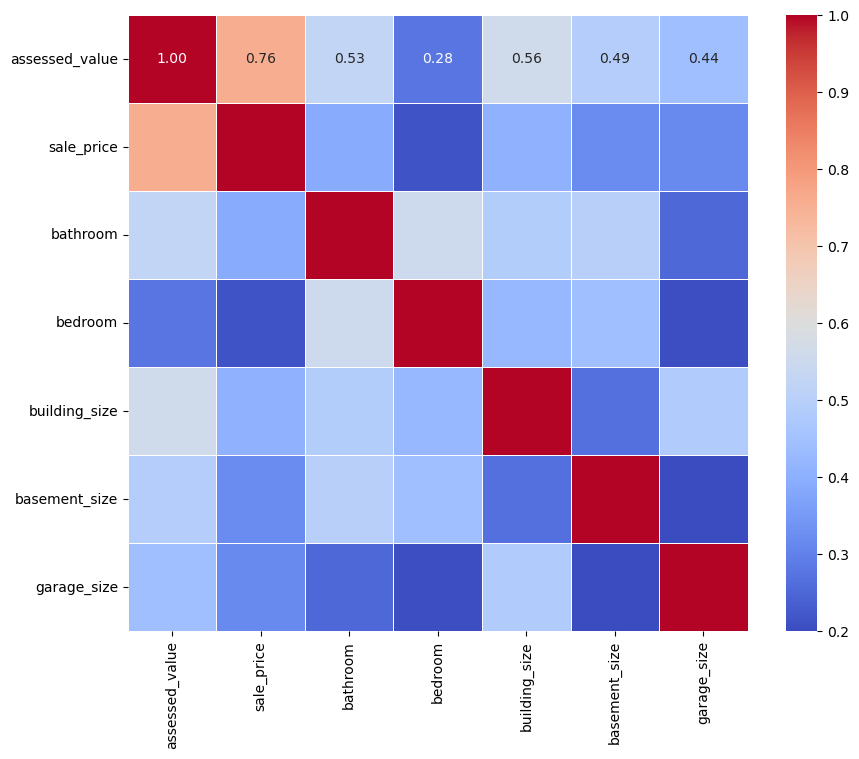

In [38]:
correlation_matrix = property_df[numeric_columns].corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)


In [39]:
property_df['total_sqft'] = property_df['building_size'] + property_df['basement_size']
property_df['bed_bath_interaction'] = property_df['bathroom'] * property_df['bedroom']
property_df['bed_bath_ratio'] = property_df['bathroom'] / property_df['bedroom']
property_df['age'] = 2024 - property_df['year']
property_df['price_per_sqft'] = property_df['assessed_value'] / property_df['total_sqft']
property_df['sale_price_zscore'] = property_df['sale_price'].apply(lambda x: (x - property_df['sale_price'].mean()) / property_df['sale_price'].std())

In [40]:
# Map the conditions and quality to numerical categories
# Get the unique conditions that need to be cleaned
print(f"Condition: {property_df['condition'].unique()}")
print(f"Quality: {property_df['quality'].unique()}")

# Map out the final conditions
conditions = {'Badly Worn': 1, 'Worn': 2, 'Average': 3, 'Good': 4, 'Excellent': 5}
# Map out the conditions to clean into temporary conditions
condition_mapping = {'B': 'Badly Worn', 'Badly Worn': 'Badly Worn', 'Worn Out': 'Worn', 'W': 'Worn',
                     'Average': 'Average', 'A': 'Average', 'Average - Good': 'Good','Good': 'Good',  
                     'G': 'Good', 'Very Good': 'Excellent', 'V': 'Excellent', 'Excellent': 'Excellent', 'E': 'Excellent'}
# Same for quality feature
quality_mapping = {'Low' : 'Low', 'L': 'Low', 'Fair':'Fair', 'F': 'Fair', 'Average': 'Average', 'A': 'Average', 'Average +': 'Good',
                   'Good': 'Good', 'G': 'Good', 'Very Good': 'Excellent'}
qualities = {'Low': 1, 'Fair': 2, 'Average': 3, 'Good': 4, 'Excellent': 5}
# Map initial conditions to clean up feature
property_df['conditions_converted'] = property_df['condition'].map(condition_mapping)
# map final conditions
property_df['conditions_converted'] = property_df['conditions_converted'].map(conditions)
# Map initial qualities to clean up feature
property_df['quality_converted'] = property_df['quality'].map(quality_mapping)
# Print out unique qualities to ensure there aren't any NaNs
property_df['quality_converted'].unique()
# Map final conditions
property_df['quality_converted'] = property_df['quality_converted'].map(qualities)
# Confirm that output is correct
print(f"Condition: {property_df['conditions_converted'].unique()}")
print(f"Quality: {property_df['quality_converted'].unique()}")


Condition: ['Average' 'Good' 'Worn Out' 'A' 'Badly Worn' 'B' 'Average - Good' 'G'
 'Very Good' 'W' 'V' 'Excellent' 'E']
Quality: ['Fair' 'Average' 'Low' 'F' 'Good' 'A' 'G' 'Very Good' 'L']
Condition: [3 4 2 1 5]
Quality: [2 3 1 4 5]


In [45]:
# Create a subset dataframe to eliminate outliers
subset_df = property_df.loc[np.abs(property_df['sale_price_zscore']) <= 3]
# View subset
subset_df

,pid,assessed_value,sale_date,sale_price,condition,year,bathroom,bedroom,building_size,basement_size,garage_size,quality,total_sqft,bed_bath_interaction,bed_bath_ratio,age,price_per_sqft,sale_price_zscore,conditions_converted,quality_converted
0,530045583,80355,03/19/2019,55000.00,Average,1948,2.00,3,1144,1144,NaN,Fair,2288,6.00,0.67,76,35.12,-0.46,3,2
1,530048671,136225,01/28/2022,210000.00,Good,1912,2.00,4,2289,345,NaN,Average,2634,8.00,0.50,112,51.72,0.84,4,3
2,530040174,76270,09/28/2023,68000.00,Good,1920,1.00,2,1008,196,825.00,Low,1204,2.00,0.50,104,63.35,-0.35,4,1
3,530045737,52430,09/16/2021,55000.00,Worn Out,1906,0.00,5,2568,1110,NaN,Average,3678,0.00,0.00,118,14.26,-0.46,2,3
4,530018837,97760,11/18/2022,60000.00,Average,1980,1.00,3,1111,0,NaN,Fair,1111,3.00,0.33,44,87.99,-0.42,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
717,530044307,82490,05/18/2020,60900.00,Good,1925,1.00,2,1093,250,NaN,Fair,1343,2.00,0.50,99,61.42,-0.41,4,2
718,530063484,23950,06/15/2020,10000.00,Average,1975,1.00,3,938,0,NaN,Fair,938,3.00,0.33,49,25.53,-0.84,3,2
719,530033542,63070,06/22/2023,92500.00,Average,1960,1.00,3,925,0,NaN,Average,925,3.00,0.33,64,68.18,-0.15,3,3
720,530041456,35345,11/29/2021,73000.00,Average,1918,1.00,2,672,336,216.00,Fair,1008,2.00,0.50,106,35.06,-0.31,3,2


In [42]:
numeric_columns = numeric_columns = ['assessed_value', 'year', 'bathroom', 'bedroom', 'building_size', 
                   'basement_size', 'garage_size', 'sale_price', 'total_sqft','bed_bath_ratio', 'age', 
                    'conditions_converted', 'price_per_sqft', 'quality_converted']
correlation_matrix = property_df[numeric_columns].corr()
sale_price_correlation = correlation_matrix['sale_price'].sort_values(ascending=False)
sale_price_correlation

sale_price              1.00
assessed_value          0.76
price_per_sqft          0.48
total_sqft              0.46
building_size           0.41
bathroom                0.39
quality_converted       0.35
basement_size           0.32
garage_size             0.32
year                    0.23
bedroom                 0.22
conditions_converted    0.16
bed_bath_ratio          0.15
age                    -0.23
Name: sale_price, dtype: float64

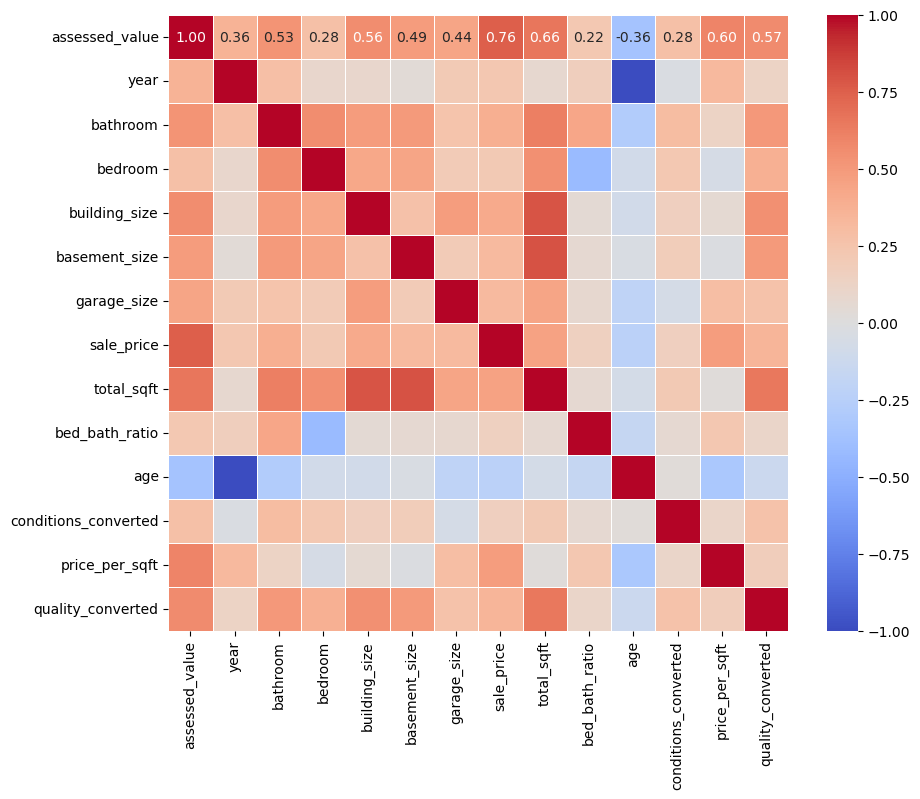

In [47]:
correlation_matrix = property_df[numeric_columns].corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.show()

## Property_df Correlation Matrix Analysis

The feature with the highest correlation is assessed_value at .76. The second best is total_sqft with .48. price_per_sqft was created dividing the assessed_value by total_sqft.
<br>
I'm not very confident in the correlations I found in the dataset. 

In [121]:
# Numeric columns for use in the correlation matrix
numeric_columns = numeric_columns = ['assessed_value', 'year', 'bathroom', 'bedroom', 'building_size', 
                   'basement_size', 'garage_size', 'sale_price', 'total_sqft','bed_bath_ratio', 'age', 
                    'conditions_converted', 'price_per_sqft', 'quality_converted']

# Create a correlation matrix for the subset df
subset_correlation_matrix = subset_df[numeric_columns].corr()

# Order the values
subset_sale_price_correlation = subset_correlation_matrix['sale_price'].sort_values(ascending=False)
# Display the correlation values
subset_sale_price_correlation

sale_price              1.00
assessed_value          0.72
bathroom                0.54
total_sqft              0.53
quality_converted       0.48
building_size           0.43
price_per_sqft          0.42
basement_size           0.41
conditions_converted    0.37
bedroom                 0.37
garage_size             0.32
year                    0.24
bed_bath_ratio          0.18
age                    -0.24
Name: sale_price, dtype: float64

In [122]:
# Create a heatmap of the subset correlation matrix
plt.figure(figsize=(10,8))
sns.heatmap(subset_correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

<Axes: >

## Subset_df Correlation Matrix Analysis

Eliminating the outliers that have a zscore above 3 or below -3 has improved the correlation of bahtroom and total_sqft, but lowered the performance of assessed_value. I feel better having improved the correlation of some of the features. 

## Bar Graphs

In [123]:
# Create a bar graph of the sale prices of houses

# Create bins to separate the house sales into categories
bins = [0, 50000, 100000, 150000, 200000, 250000, 300000, float('inf')]
labels = ['0-50k', '50k-100k', '100k-150k', '150k-200k', '200k-250k', '250k-300k', '300k+']

# Create a new column for the sale_price_group bins
property_df['sale_price_group'] = pd.cut(property_df['sale_price'], bins=bins, labels=labels, right=False)

# Get the number of house sales that fall in each group
sale_price_groups = property_df['sale_price_group'].value_counts().sort_index()

# Create the graph
sale_price_groups.plot(kind='bar', color='skyblue')
plt.title("Number of Houses per Sale Price Group")
plt.xlabel("Sale Price Group")
plt.ylabel("Number of Houses Sold")

Text(95.5815972222222, 0.5, 'Number of Houses Sold')

## Bar Graph of Sale Prices

The category that had the most sales was 0-50k, with 50k-100k as a close second. 

In [128]:
# Create a bar graph of the years houses were built

# Create bins to separate the years into categories
year_bins = [1800, 1900, 1920, 1940, 1960, 1980, 2000, 2020, float('inf')]
year_labels = ['1800-1899', '1900-1919', '1920-1939', '1940-1959', '1960-1979', '1980-1999', '2000-2019', '2020+']

# Create a new column for the year_group bins
property_df['year_group'] = pd.cut(property_df['year'], bins=year_bins, labels=year_labels, right=False)

# Get the number of houses that fall in each group
year_groups = property_df['year_group'].value_counts().sort_index()

year_groups.plot(kind='bar', color='skyblue')
plt.title("Number of Houses per Year Built Group")
plt.xlabel("Year Built Group")
plt.ylabel("Number of Houses Sold")

Text(0, 0.5, 'Number of Houses Sold')

## Bar Graph for Years Analysis

From the graph above, we can see that the majority of houses sold in the last 5 years were built in 1940-1959, with houses built between 1900-1919 the second most populated group. 

In [127]:
# Create a Count plot for sale price

bins = [0, 50000, 100000, 150000, 200000, 250000, 300000, float('inf')]

plt.figure(figsize=(10,6))
sns.countplot(x='condition', data=property_df, order=condition_labels)
plt.title('Count Plot of Sale Prices')
plt.xlabel('Sale Price')
plt.ylabel('Frequency')

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0, 0.5, 'Frequency')

## Count Plot of Sale Prices Analysis

I wanted to see a breakdown of the categories to see which one had the most houses. In this case, it looks like the 'Average' group had the most houses by a wide margin, which is to be expected.

## Histograms


In [ ]:
# Create a histogram for the years houses were built

year_bins = [1800, 1900, 1920, 1940, 1960, 1980, 2000, 2020, float('inf')]

plt.figure(figsize=(10,6))
sns.histplot(property_df['year_group'], bins=year_bins, kde=True, color='blue', edgecolor='black')
plt.title('Histogram of Year Built')
plt.xlabel('Year Built')
plt.ylabel('Frequency')

In [ ]:
# Create a histogram for the subset years houses were built

year_bins = [1800, 1900, 1920, 1940, 1960, 1980, 2000, 2020, float('inf')]

plt.figure(figsize=(10,6))
sns.histplot(subset_df['year_group'], bins=year_bins, kde=True, color='blue', edgecolor='black')
plt.title('Histogram of Year Built')
plt.xlabel('Year Built')
plt.ylabel('Frequency')

In [ ]:
# Create a histogram for the sale_price
sns.histplot(property_df['sale_price'], bins=10, kde=True, color='blue', edgecolor='black')

In [ ]:
sns.displot(property_df['sale_price'], bins=10, kde=True, color='blue')

In [ ]:
# Create a histogram for the assessed_value

sns.histplot(property_df['assessed_value'], bins=10, kde=True, color='blue', edgecolor='black')

## Scatter Plots

In [ ]:
# Create a scatter plot of sale_price vs assessed_value

# Function to format y-axis labels
def format_y_axis(value, _):
    return "${:,.0f}".format(value)

plt.figure(figsize=(10,6))
sns.scatterplot(x='assessed_value', y='sale_price', data=property_df)
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_y_axis))
plt.title('Scatter Plot: Sale Price vs Assessed Value')
plt.xlabel('Assessed Value')
plt.ylabel('Sale Price')


In [ ]:
# Create a scatter plot of sale_price vs total_sqft

plt.figure(figsize=(10,6))
sns.scatterplot(x='total_sqft', y='sale_price', data=property_df)
plt.gca().yaxis.set_major_formatter(FuncFormatter(format_y_axis))
plt.title('Scatter Plot: Sale Price vs Total House Size (sqft)')
plt.xlabel('House Size (sqft)')
plt.ylabel('Sale Price')

In [ ]:
# Create a box plot of sale_price vs conditions_converted

plt.figure(figsize=(10,6))
sns.barplot(x='conditions_converted', y='sale_price', data=property_df, estimator=np.median)
plt.title('Box Plot: Sale Price vs House Condition')
plt.xlabel('Condition of House')
plt.ylabel('Sale Price')
condition_labels = ['Badly Worn', 'Worn', 'Average', 'Good', 'Excellent']
plt.xticks(range(len(condition_labels)), condition_labels)

In [ ]:
# Create a countplot for number of houses in each condition
plt.figure(figsize=(10,6))
sns.countplot(x='condition', data=property_df, order=condition_labels)
plt.title('Count of Houses by Condition')
plt.xlabel('Condition')
plt.ylabel('Count')

In [ ]:
# Create a histplot for sale_price
plt.figure(figsize=(10,6))
sns.histplot(subset_df['sale_price'], bins=5)

In [ ]:
property_df.sort_values(by='pid')